# Projeto Final

## Contexto do Problema de Negócio

Parabéns! Você acaba de ser contratado como Cientista de Dados da empresa
Fome Zero, e a sua principal tarefa nesse momento é ajudar o CEO Kleiton Guerra
a identificar pontos chaves da empresa, respondendo às perguntas que ele fizer
utilizando dados!
A empresa Fome Zero é uma marketplace de restaurantes. Ou seja, seu core
business é facilitar o encontro e negociações de clientes e restaurantes. Os
restaurantes fazem o cadastro dentro da plataforma da Fome Zero, que disponibiliza
informações como endereço, tipo de culinária servida, se possui reservas, se faz
entregas e também uma nota de avaliação dos serviços e produtos do restaurante,
dentre outras informações.

# Inicio do Código

In [1]:
# Imports

import pandas as pd
import inflection
import plotly.express as px

In [2]:
# Lendo os dados 

df_raw = pd.read_csv( 'data/zomato.csv' )

## 2. Entenda os dados que você está trabalhando:

a. O que cada coluna representa?

b. Existem colunas que podem ser removidas do DataFrame, por possuir
somente 1 valor em todas as linhas?

In [3]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7527 entries, 0 to 7526
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         7527 non-null   int64  
 1   Restaurant Name       7527 non-null   object 
 2   Country Code          7527 non-null   int64  
 3   City                  7527 non-null   object 
 4   Address               7527 non-null   object 
 5   Locality              7527 non-null   object 
 6   Locality Verbose      7527 non-null   object 
 7   Longitude             7527 non-null   float64
 8   Latitude              7527 non-null   float64
 9   Cuisines              7512 non-null   object 
 10  Average Cost for two  7527 non-null   int64  
 11  Currency              7527 non-null   object 
 12  Has Table booking     7527 non-null   int64  
 13  Has Online delivery   7527 non-null   int64  
 14  Is delivering now     7527 non-null   int64  
 15  Switch to order menu 

## Limpeza e Tratamento dos Dados

In [4]:
df = df_raw.copy()


# Removendo Colunas com apenas 1 valor unico.
drop_col = [ col for col in df_raw.nunique().index if df_raw.nunique()[col] == 1 ]
df = df.drop( drop_col, axis=1 )

# Remove linhas com valores faltantes
df = df.dropna( how='any', axis= 0 )

# Renomear as colunas do DataFrame
def rename_columns(dataframe):
    df = dataframe.copy()
    title = lambda x: inflection.titleize(x)
    snakecase = lambda x: inflection.underscore(x)
    spaces = lambda x: x.replace(" ", "")
    cols_old = list(df.columns)
    cols_old = list(map(title, cols_old))
    cols_old = list(map(spaces, cols_old))
    cols_new = list(map(snakecase, cols_old))
    df.columns = cols_new
    return df

# Renomeia as colunas
df = rename_columns( df )

# Preenchimento do nome dos países
COUNTRIES = {
1: "India",
14: "Australia",
30: "Brazil",
37: "Canada",
94: "Indonesia",
148: "New Zeland",
162: "Philippines",
166: "Qatar",
184: "Singapure",
189: "South Africa",
191: "Sri Lanka",
208: "Turkey",
214: "United Arab Emirates",
215: "England",
216: "United States of America",
}
def country_name(country_id):
    return COUNTRIES[country_id]



# cria coluna com nome do país
df.insert( 3, 'country', df['country_code'].apply( country_name ) )

# Criação do Tipo de Categoria de Comida

def create_price_type(price_range):
    if price_range == 1:
        return "cheap"
    elif price_range == 2:
        return "normal"
    elif price_range == 3:
        return "expensive"
    else:
        return "gourmet"

# cria coluna com categoria de preço
df.insert( 17 , 'price_type', df['price_range'].apply( create_price_type ) )

# Criação do nome das Cores
COLORS = {
"3F7E00": "darkgreen",
"5BA829": "green",
"9ACD32": "lightgreen",
"CDD614": "orange",
"FFBA00": "red",
"CBCBC8": "darkred",
"FF7800": "darkred",
}

def color_name(color_code):
    return COLORS[color_code]

#cria coluna com nome da cores
df.insert( 19 , 'color', df['rating_color'].apply( color_name ) )


# categoriza restaurantes por apenas 1 tipo de cozinha
df["cuisines"] = df.loc[:, "cuisines"].apply(lambda x: x.split(",")[0])


# Remove linhas duplicadas
df.drop_duplicates(keep='first', inplace=True)


# Remove linhas com valores zerados
df.drop( df[ df['average_cost_for_two'] == 0 ].index , axis=0, inplace=True )
df.drop( df[ df['votes'] == 0 ].index , axis=0, inplace=True )

# Remove 1 linha com valor inconsistente 
df.drop( df[ df.average_cost_for_two == df.average_cost_for_two.max() ].index, inplace=True )



In [5]:
df.average_cost_for_two.max()

1200000

## Respondendo as Perguntas

### Geral

1. Quantos restaurantes únicos estão registrados?,

    Somar o total de valores únicos de IDs da coluna 'Restaurant ID'.

2. Quantos países únicos estão registrados?

    Somar o total de valores únicos da coluna 'Country Code'.


    
3. Quantas cidades únicas estão registradas?

    Somar o total de valores únicos da coluna 'City'.
    
4. Qual o total de avaliações feitas?

    Somatório dos valores da coluna 'Votes'.

    
5. Qual o total de tipos de culinária registrados?

    

In [6]:
# 1. Quantos restaurantes únicos estão registrados?

df['restaurant_id'].nunique()

6864

In [7]:
# 2. Quantos países únicos estão registrados?

df['country_code'].nunique()

15

In [8]:
# 3. Quantas cidades únicas estão registradas?

df['city'].nunique()

125

In [9]:
# 4. Qual o total de avaliações feitas?

df['votes'].sum()

4188309

In [10]:
# 5. Qual o total de tipos de culinária registrados?

df['cuisines'].nunique()

164

In [11]:
df

,restaurant_id,restaurant_name,country_code,country,city,address,locality,locality_verbose,longitude,latitude,...,has_table_booking,has_online_delivery,is_delivering_now,price_range,price_type,aggregate_rating,color,rating_color,rating_text,votes
0,6310675,Mama Lou's Italian Kitchen,162,Philippines,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,...,1,0,0,3,expensive,4.6,darkgreen,3F7E00,Excellent,619
2,6314542,Blackbird,162,Philippines,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,...,0,0,0,4,gourmet,4.7,darkgreen,3F7E00,Excellent,469
3,6301293,Banapple,162,Philippines,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,...,0,0,0,3,expensive,4.4,green,5BA829,Very Good,867
4,6315689,Bad Bird,162,Philippines,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,...,0,0,0,3,expensive,4.4,green,5BA829,Very Good,858
5,6304833,Manam,162,Philippines,Makati City,"Level 1, Greenbelt 2, Ayala Center, Greenbelt,...","Greenbelt 2, San Lorenzo, Makati City","Greenbelt 2, San Lorenzo, Makati City, Makati ...",121.020380,14.552351,...,0,0,0,3,expensive,4.7,darkgreen,3F7E00,Excellent,930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7522,5912546,Eataly,208,Turkey,İstanbul,"Zorlu Center AVM, Köprü Katı, Levazım Mahalles...","Zorlu Center AVM, Levazım, Beşiktaş","Zorlu Center AVM, Levazım, Beşiktaş, İstanbul",29.017326,41.065322,...,0,0,0,4,gourmet,4.3,green,5BA829,Very Good,1367
7523,5913006,Tarihi Çınaraltı Aile Çay Bahçesi,208,Turkey,İstanbul,"Çengelköy Mahallesi, Çınaraltı Camii Sokak, No...",Çengelköy Merkez,"Çengelköy Merkez, İstanbul",29.052620,41.050280,...,0,0,0,2,normal,4.5,darkgreen,3F7E00,Excellent,1172
7524,5923535,Boon Cafe & Restaurant,208,Turkey,İstanbul,"Çengelköy Mahallesi, Çengelköy Caddesi, Kara S...",Çengelköy Merkez,"Çengelköy Merkez, İstanbul",29.052623,41.050717,...,0,0,0,4,gourmet,4.2,green,5BA829,Very Good,1160
7525,5914190,Kanaat Lokantası,208,Turkey,İstanbul,"Sultantepe Mahallesi, Selmani Pak Caddesi, No ...",Üsküdar Merkez,"Üsküdar Merkez, İstanbul",29.016590,41.025741,...,0,0,0,3,expensive,4.0,green,5BA829,Very Good,770


### Pais

1. Qual o nome do país que possui mais cidades registradas?
2. Qual o nome do país que possui mais restaurantes registrados?
3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?
4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?
5. Qual o nome do país que possui a maior quantidade de avaliações feitas?
6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?
7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?
8. Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?
9. Qual o nome do país que possui, na média, a maior nota média registrada?
10. Qual o nome do país que possui, na média, a menor nota média registrada?
11. Qual a média de preço de um prato para dois por país?

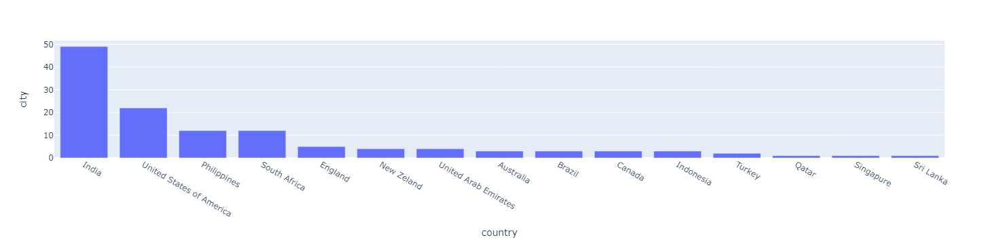

In [12]:
# 1. Qual o nome do país que possui mais cidades registradas?

dfaux = df.groupby('country').city.nunique().sort_values(ascending=False).reset_index()

px.bar(dfaux, x='country', y='city')

In [13]:
# 2. Qual o nome do país que possui mais restaurantes registrados?

df.groupby('country').restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

country          India
restaurant_id     3103
Name: 0, dtype: object

In [14]:
# 3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?

dfaux = df.query( 'price_range == 4' )
dfaux.groupby( 'country' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

country          United States of America
restaurant_id                         415
Name: 0, dtype: object

In [15]:
# 4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?

df.groupby( 'country' ).cuisines.nunique().sort_values(ascending=False).reset_index().iloc[0]

country     India
cuisines       77
Name: 0, dtype: object

In [16]:
# 5. Qual o nome do país que possui a maior quantidade de avaliações feitas?

df.groupby( 'country' ).votes.sum().sort_values(ascending=False).reset_index().iloc[0]

country      India
votes      2800119
Name: 0, dtype: object

In [17]:
# 6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?

dfaux = df.query( 'is_delivering_now == 1' )
dfaux.groupby( 'country' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

# apenas 4 países possuem dados sobre delivery

country          India
restaurant_id     1150
Name: 0, dtype: object

In [18]:
# 7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?

dfaux = df.query( 'has_table_booking == 1' )
dfaux.groupby( 'country' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

country          India
restaurant_id      256
Name: 0, dtype: object

In [19]:
# 8. Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?


df.groupby( 'country' ).votes.mean().astype(int).sort_values(ascending=False).reset_index().iloc[0]

country    Indonesia
votes           1112
Name: 0, dtype: object

In [20]:
# 9. Qual o nome do país que possui, na média, a maior nota média registrada?

df.groupby( 'country' ).aggregate_rating.mean().round(2).sort_values(ascending=False).reset_index().iloc[0]

country             Indonesia
aggregate_rating          4.6
Name: 0, dtype: object

In [21]:
# 10. Qual o nome do país que possui, na média, a menor nota média registrada?

df.groupby( 'country' ).aggregate_rating.mean().round(2).sort_values(ascending=False).reset_index().iloc[-1]

country             Brazil
aggregate_rating      3.51
Name: 14, dtype: object

In [22]:
# 11. Qual a média de preço de um prato para dois por país?

df.groupby( ['country', 'currency'] ).average_cost_for_two.mean().round(2).sort_values(ascending=False).reset_index()

,country,currency,average_cost_for_two
0,Indonesia,Indonesian Rupiah(IDR),303000.00
1,Sri Lanka,Sri Lankan Rupee(LKR),2612.03
2,Philippines,Botswana Pula(P),1227.82
3,India,Indian Rupees(Rs.),705.80
4,South Africa,Rand(R),344.20
5,Qatar,Qatari Rial(QR),174.00
6,United Arab Emirates,Emirati Diram(AED),156.85
7,Brazil,Brazilian Real(R$),144.44
8,Singapure,Dollar($),141.44
9,Turkey,Turkish Lira(TL),128.58


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6864 entries, 0 to 7526
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   restaurant_id         6864 non-null   int64  
 1   restaurant_name       6864 non-null   object 
 2   country_code          6864 non-null   int64  
 3   country               6864 non-null   object 
 4   city                  6864 non-null   object 
 5   address               6864 non-null   object 
 6   locality              6864 non-null   object 
 7   locality_verbose      6864 non-null   object 
 8   longitude             6864 non-null   float64
 9   latitude              6864 non-null   float64
 10  cuisines              6864 non-null   object 
 11  average_cost_for_two  6864 non-null   int64  
 12  currency              6864 non-null   object 
 13  has_table_booking     6864 non-null   int64  
 14  has_online_delivery   6864 non-null   int64  
 15  is_delivering_now    

### Cidade

1. Qual o nome da cidade que possui mais restaurantes registrados?
2. Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?
3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?
4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?
5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?
6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?
7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?
8. Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

In [24]:
# 1. Qual o nome da cidade que possui mais restaurantes registrados?

df.groupby('city').restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

city             Abu Dhabi
restaurant_id           80
Name: 0, dtype: object

In [25]:
# 2. Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?

dfaux = df.query( 'aggregate_rating > 4' )
dfaux.groupby( 'city' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

city             Bangalore
restaurant_id           79
Name: 0, dtype: object

In [26]:
# 3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?

dfaux = df.query( 'aggregate_rating < 2.5' )
dfaux.groupby( 'city' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

city             Gangtok
restaurant_id         31
Name: 0, dtype: object

In [27]:
# 4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?

dfaux = df.groupby( ['country', 'city', 'currency'] ).average_cost_for_two.mean().round(2).reset_index()
dfaux = dfaux.loc[ dfaux.groupby( 'country' ).average_cost_for_two.idxmax() ].reset_index(drop=True)
dfaux

# Não faz sentido mostrar apenas uma cidade, pois as moedas são diferentes.

,country,city,currency,average_cost_for_two
0,Australia,Brisbane,Dollar($),78.33
1,Brazil,São Paulo,Brazilian Real(R$),175.42
2,Canada,Ottawa,Dollar($),58.16
3,England,London,Pounds(£),62.06
4,India,Noida,Indian Rupees(Rs.),1407.14
5,Indonesia,Jakarta,Indonesian Rupiah(IDR),309605.26
6,New Zeland,Wellington City,NewZealand($),70.53
7,Philippines,Pasay City,Botswana Pula(P),4000.00
8,Qatar,Doha,Qatari Rial(QR),174.00
9,Singapure,Singapore,Dollar($),141.44


In [28]:
# 5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?

dfaux= df.groupby('city').cuisines.nunique().sort_values(ascending=False).reset_index()
dfaux

,city,cuisines
0,Doha,31
1,Montreal,30
2,Manchester,30
3,Birmingham,30
4,São Paulo,29
...,...,...
120,Las Piñas City,1
121,Marikina City,1
122,Roodepoort,1
123,Muntinlupa City,1


In [29]:
# 6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?

dfaux = df.query( 'has_table_booking == 1' )

dfaux.groupby( 'city' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

city             Bangalore
restaurant_id           42
Name: 0, dtype: object

In [30]:
# 7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?

dfaux = df.query( 'is_delivering_now == 1' )

dfaux.groupby( 'city' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

city             Vadodara
restaurant_id          48
Name: 0, dtype: object

In [31]:
# 8. Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

dfaux = df.query( 'has_online_delivery == 1' )

dfaux.groupby( 'city' ).restaurant_id.nunique().sort_values(ascending=False).reset_index().iloc[0]

city             Bhopal
restaurant_id        75
Name: 0, dtype: object

### Restaurantes

1. Qual o nome do restaurante que possui a maior quantidade de avaliações?
2. Qual o nome do restaurante com a maior nota média?
3. Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?
4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?
5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?
6. Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?
7. Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?
8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

In [32]:
# 1. Qual o nome do restaurante que possui a maior quantidade de avaliações?

df.groupby( ['restaurant_id', 'restaurant_name'] ).votes.sum().sort_values(ascending=False).reset_index().iloc[0]

restaurant_id         90896
restaurant_name    Bawarchi
votes                 41333
Name: 0, dtype: object

In [33]:
# 2. Qual o nome do restaurante com a maior nota média?
df.groupby( ['restaurant_id', 'restaurant_name'] ).aggregate_rating.mean().sort_values(ascending=False).reset_index().iloc[0]

restaurant_id       6127163
restaurant_name         Bao
aggregate_rating        4.9
Name: 0, dtype: object

In [34]:
# 3. Qual o nome do restaurante que possui o maior valor de um prato para duas pessoas?

df.groupby( ['restaurant_id', 'restaurant_name', 'currency'] ).average_cost_for_two.max().sort_values(ascending=False).reset_index().iloc[0]

restaurant_id                          7403667
restaurant_name         The Café - Hotel Mulia
currency                Indonesian Rupiah(IDR)
average_cost_for_two                   1200000
Name: 0, dtype: object

In [35]:
# 4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?


dfaux = df.query( 'cuisines == "Brazilian" ' )
menor_nota_media = dfaux.aggregate_rating.min()
dfaux = dfaux.query( 'aggregate_rating == @menor_nota_media' )
dfaux.sort_values('restaurant_id')[ ['restaurant_name', 'aggregate_rating'] ].iloc[0]
# restaurant_id = dfaux.restaurant_id.min()
# df.query( 'restaurant_id == @restaurant_id' )[ ['restaurant_name', 'aggregate_rating'] ]

restaurant_name     Loca Como tu Madre
aggregate_rating                   0.0
Name: 126, dtype: object

In [36]:
# 5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?

dfaux = df.query( 'country == "Brazil" & cuisines == "Brazilian" ' )
maior_nota_media = dfaux.aggregate_rating.max()
dfaux = dfaux.query( 'aggregate_rating == @maior_nota_media' )
dfaux.sort_values('restaurant_id')[ ['restaurant_name', 'aggregate_rating'] ].iloc[0]


restaurant_name     Braseiro da Gávea
aggregate_rating                  4.9
Name: 207, dtype: object

In [37]:
# 6. Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?

df.groupby( 'has_online_delivery' ).votes.mean().reset_index()

,has_online_delivery,votes
0,0,484.824245
1,1,839.513190


In [38]:
# 7. Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?

df.groupby( 'has_table_booking' ).price_type.apply(pd.Series.mode)

has_table_booking   
0                  0       normal
1                  0    expensive
Name: price_type, dtype: object

In [39]:
# 8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

cuisines = ['Japanese', 'BBQ']
dfaux = df.query('country == "United States of America" & cuisines in @cuisines')
dfaux.groupby( 'cuisines' ).average_cost_for_two.mean().reset_index().round(2)

,cuisines,average_cost_for_two
0,BBQ,39.64
1,Japanese,56.41


### Tipos de Culinária

1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?
2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?
3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?
4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?
5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?
6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?
7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?
8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?
9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?
10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?
11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?
12. Qual o tipo de culinária que possui a maior nota média?
13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

In [40]:
# 1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?

dfaux = df.query( 'cuisines == "Italian"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[False, True]).iloc[0]

restaurant_id         10021
restaurant_name     Darshan
cuisines            Italian
aggregate_rating        4.9
Name: 5408, dtype: object

In [41]:
# 2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?
dfaux = df.query( 'cuisines == "Italian"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[True, True]).iloc[0]

restaurant_id       6715707
restaurant_name         Più
cuisines            Italian
aggregate_rating        0.0
Name: 324, dtype: object

In [42]:
# 3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?

dfaux = df.query( 'cuisines == "American"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[False, True]).iloc[0]

restaurant_id                6102616
restaurant_name     Burger & Lobster
cuisines                    American
aggregate_rating                 4.9
Name: 6648, dtype: object

In [43]:
# 4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?

dfaux = df.query( 'cuisines == "American"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[True, True]).iloc[0]

restaurant_id                        18445965
restaurant_name     Guy Fieri's Kitchen & Bar
cuisines                             American
aggregate_rating                          2.2
Name: 7204, dtype: object

In [44]:
# 5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?

dfaux = df.query( 'cuisines == "Arabian"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[False, True]).iloc[0]

restaurant_id       18535007
restaurant_name     Mandi@36
cuisines             Arabian
aggregate_rating         4.7
Name: 3896, dtype: object

In [45]:
# 6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?

dfaux = df.query( 'cuisines == "Arabian"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[True, True]).iloc[0]

restaurant_id       6706513
restaurant_name       Raful
cuisines            Arabian
aggregate_rating        0.0
Name: 337, dtype: object

In [46]:
# 7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?

dfaux = df.query( 'cuisines == "Japanese"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[False, True]).iloc[0]

restaurant_id           6107336
restaurant_name     Sushi Samba
cuisines               Japanese
aggregate_rating            4.9
Name: 6633, dtype: object

In [47]:
# 8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?

dfaux = df.query( 'cuisines == "Japanese"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[True, True]).iloc[0]

restaurant_id            6600203
restaurant_name     Banzai Sushi
cuisines                Japanese
aggregate_rating             0.0
Name: 123, dtype: object

In [48]:
# 9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?

dfaux = df.query( 'cuisines == "Home-made"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[False, True]).iloc[0]

restaurant_id                5914190
restaurant_name     Kanaat Lokantası
cuisines                   Home-made
aggregate_rating                 4.0
Name: 7525, dtype: object

In [49]:
# 10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?

dfaux = df.query( 'cuisines == "Home-made"')
dfaux[ ['restaurant_id', 'restaurant_name', 'cuisines', 'aggregate_rating'] ].sort_values(by=['aggregate_rating', 'restaurant_id'], ascending=[True, True]).iloc[0]

restaurant_id                   6007184
restaurant_name     GurMekan Restaurant
cuisines                      Home-made
aggregate_rating                    3.7
Name: 7373, dtype: object

In [50]:
# 11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?
df.groupby( 'cuisines' ).average_cost_for_two.mean().sort_values(ascending=False).head(1)

cuisines
Western    333333.333333
Name: average_cost_for_two, dtype: float64

In [51]:
# 12. Qual o tipo de culinária que possui a maior nota média?

df.groupby( 'cuisines' ).aggregate_rating.mean().sort_values(ascending=False).head(1)

cuisines
Fusion    4.9
Name: aggregate_rating, dtype: float64

In [52]:
# 13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

dfaux = df.query('has_online_delivery == 1 & is_delivering_now == 1')
dfaux.groupby( 'cuisines' ).restaurant_id.nunique().sort_values(ascending=False).head(1)

cuisines
North Indian    317
Name: restaurant_id, dtype: int64

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6864 entries, 0 to 7526
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   restaurant_id         6864 non-null   int64  
 1   restaurant_name       6864 non-null   object 
 2   country_code          6864 non-null   int64  
 3   country               6864 non-null   object 
 4   city                  6864 non-null   object 
 5   address               6864 non-null   object 
 6   locality              6864 non-null   object 
 7   locality_verbose      6864 non-null   object 
 8   longitude             6864 non-null   float64
 9   latitude              6864 non-null   float64
 10  cuisines              6864 non-null   object 
 11  average_cost_for_two  6864 non-null   int64  
 12  currency              6864 non-null   object 
 13  has_table_booking     6864 non-null   int64  
 14  has_online_delivery   6864 non-null   int64  
 15  is_delivering_now    

In [54]:
df.cuisines.unique()

array(['Italian', 'European', 'Filipino', 'American', 'Korean', 'Pizza',
       'Taiwanese', 'Japanese', 'Coffee', 'Chinese', 'Seafood',
       'Singaporean', 'Vietnamese', 'Latin American', 'Healthy Food',
       'Cafe', 'Fast Food', 'Brazilian', 'Argentine', 'Arabian', 'Bakery',
       'Tex-Mex', 'Bar Food', 'International', 'French', 'Steak',
       'German', 'Sushi', 'Grill', 'Peruvian', 'North Eastern',
       'Ice Cream', 'Burger', 'Mexican', 'Vegetarian', 'Contemporary',
       'Desserts', 'Juices', 'Beverages', 'Spanish', 'Thai', 'Indian',
       'BBQ', 'Mongolian', 'Portuguese', 'Greek', 'Asian', 'Author',
       'Gourmet Fast Food', 'Lebanese', 'Modern Australian', 'African',
       'Coffee and Tea', 'Australian', 'Middle Eastern', 'Malaysian',
       'Tapas', 'New American', 'Pub Food', 'Southern', 'Diner', 'Donuts',
       'Southwestern', 'Sandwich', 'Irish', 'Mediterranean', 'Cafe Food',
       'Korean BBQ', 'Fusion', 'Canadian', 'Breakfast', 'Cajun',
       'New Mexican',

In [55]:
list(df.country.unique())

['Philippines',
 'Brazil',
 'Australia',
 'United States of America',
 'Canada',
 'Singapure',
 'United Arab Emirates',
 'India',
 'Indonesia',
 'New Zeland',
 'England',
 'Qatar',
 'South Africa',
 'Sri Lanka',
 'Turkey']

In [56]:
import folium
from folium.plugins import MarkerCluster

cols = ['city', 'cuisines', 'restaurant_name', 'latitude', 'longitude']
dfaux = df[cols]

map = folium.Map([-15.7829277,-47.8769482],zoom_start=2.5)

# Crie um objeto MarkerCluster
marker_cluster = MarkerCluster().add_to(map)



# folium.Marker ( [latitude, longitude ) ]
for i, row in dfaux.iterrows():
    popup_text = f"Cidade: <b>{row.city}</b><br>Cozinha: <b>{row.cuisines}</b><br>Restaurante: <b>{row.restaurant_name}</b>"    
    folium.Marker(
        location=[row.latitude, row.longitude],
        popup=folium.Popup(folium.Html(popup_text, script=True), parse_html=True),
        icon=None
    ).add_to( marker_cluster )

map

In [57]:
dfaux = df[cols]
dfaux

,city,cuisines,restaurant_name,latitude,longitude
0,Las Piñas City,Italian,Mama Lou's Italian Kitchen,14.447615,121.009787
2,Makati City,European,Blackbird,14.556042,121.024562
3,Makati City,Filipino,Banapple,14.556196,121.023171
4,Makati City,American,Bad Bird,14.565899,121.027708
5,Makati City,Filipino,Manam,14.552351,121.020380
...,...,...,...,...,...
7522,İstanbul,Italian,Eataly,41.065322,29.017326
7523,İstanbul,Fast Food,Tarihi Çınaraltı Aile Çay Bahçesi,41.050280,29.052620
7524,İstanbul,Restaurant Cafe,Boon Cafe & Restaurant,41.050717,29.052623
7525,İstanbul,Home-made,Kanaat Lokantası,41.025741,29.016590
